In [1]:
import os
import scanpy as sc
import pandas as pd

import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
# import SpatialDE
# import NaiveDE
# import SpaGCN as spg
from scipy.sparse import issparse
import matplotlib.pyplot as plt
import seaborn as sns



In [2]:
import sys
sys.path.append('../../')

from downstream.svg import detect_svg
from downstream.plotting import svgplot,gheatmap

import utils

# Config

In [21]:
# set global rc parameters
sc.settings.set_figure_params(vector_friendly=True)

utils.config_rc(dpi=300, font_size=6)
# mpl.rcParams


In [4]:
wk_root = os.path.abspath(os.path.join(os.getcwd(), os.pardir, os.pardir))

# Find SVG

In [60]:
# stereo-seq mouse embryo data result root path
data_root = utils.get_path('svg_wk_root', json_path=os.path.join(wk_root, '_data.json'))

me_genes = pd.read_csv(os.path.join(data_root, 'notebook/results/SVG/svg_ME_All_Domain_NotFilter.csv'), 
                       names=['gene', 'pvals_adj', 'log2_fc', 'in_fraction', 'out_fraction', 'max_fraction', 
    'in_expr_mean_log', 'in_expr_cv','max_expr_mean_log', 'max_expr_cv', 'max_expr_domain', 
    'log2_fc_in_max','domain', 'cv_r', 'in_out_fraction', 'in_max_fraction'], header=0)

In [61]:
d_svg = me_genes.copy()

In [62]:
d_svg

,gene,pvals_adj,log2_fc,in_fraction,out_fraction,max_fraction,in_expr_mean_log,in_expr_cv,max_expr_mean_log,max_expr_cv,max_expr_domain,log2_fc_in_max,domain,cv_r,in_out_fraction,in_max_fraction
0,Krt15,7.822659e-209,13.592575,0.804348,0.506612,0.946204,2.508924,1.232423,2.868363,0.885995,4,-7.670059,16,1.391005,1.587699,0.850079
1,Krt5,8.488483e-195,5.602759,0.627717,0.239949,0.758170,1.524490,1.394068,1.494415,0.977396,4,0.202274,16,1.426308,2.616048,0.827938
2,Dsp,2.866362e-191,4.255681,0.626359,0.228935,0.717446,1.316108,1.266318,1.584947,1.044971,4,-1.726600,16,1.211822,2.735963,0.873040
3,Krt13,1.785772e-183,14.144400,0.506114,0.095169,0.230015,2.212533,1.733972,0.562381,2.549745,4,11.568592,16,0.680057,5.318079,2.200352
4,Igfbp2,8.811457e-164,3.759923,0.882473,0.608283,0.933992,1.653796,1.033094,1.925834,0.826821,9,-2.374581,16,1.249477,1.450761,0.944839
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
807625,Cdk8,1.080555e-03,-9.990785,0.680000,0.970898,1.000000,1.532885,0.996208,2.731700,0.369890,14,-15.515151,27,2.693254,0.700382,0.680000
807626,Gm26561,2.350381e-05,-11.186845,0.520000,0.927924,0.998255,1.123840,1.308433,2.897339,0.547066,9,-21.904624,27,2.391730,0.560391,0.520909
807627,Gphn,1.642442e-05,-8.335964,0.200000,0.826587,0.991311,0.428601,2.193638,2.667028,0.658204,23,-19.826887,27,3.332763,0.241959,0.201753
807628,Gm42418,3.807197e-07,-161.156360,1.000000,1.000000,1.000000,3.793109,0.332317,5.028078,0.584233,16,-156.164661,27,0.568808,1.000000,1.000000


In [63]:
# df_group = d_svg.copy()

# max_p=0.05
# max_in_p=0.05
# min_in_frac=0.75
# min_log2fc=1.5
# min_log2fc_in_max=1.5
# min_in_out_frac=1.
# min_in_max_frac=0.95 
# cut_min_in_out_frac=1.2
# cut_min_log2fc=3.0
# cut_min_log2fc_in_max=3.0
# cut_min_in_max_frac=1
# cut_min_in_expr_cv=0.6

# cond1 = ((df_group['pvals_adj'] < max_p) &
# #                           (df_group['in_max_p'] < max_in_p) &
#                       (df_group['in_fraction'] > min_in_frac) &
#                       (df_group['log2_fc_in_max'] > min_log2fc_in_max) &
#                       (df_group['log2_fc'] > min_log2fc) &
#                       (df_group['in_max_fraction'] > min_in_max_frac) &
#                       (df_group['in_out_fraction'] > min_in_out_frac))
                     
# # cond1_cut = (df_group['in_out_fraction']> cut_min_in_out_frac)
# cond2_cut = ((df_group['log2_fc']>cut_min_log2fc)&(df_group['log2_fc_in_max']>cut_min_log2fc_in_max)&(df_group['in_out_fraction']> cut_min_in_out_frac)&(df_group['in_expr_cv']<cut_min_in_expr_cv))

# df_group=df_group.loc[cond1|cond2_cut]

# print(df_group.shape[0])
# df_group

df_group = d_svg.copy()

max_p=0.05
max_in_p=0.05
min_in_frac=0.75
min_log2fc=1.5
min_log2fc_in_max=1.5

min_in_out_frac=1.
min_in_max_frac=0.95

cut_min_in_out_frac=1.2
cut_min_log2fc=3.0
cut_min_log2fc_in_max=3.0
cut_min_in_max_frac=1.2
cut_min_in_expr_cv=0.6
cut_max_cv_r = 1.0

min_high_log2_fc=8

pre_req = (
    (df_group['pvals_adj'] < max_p) &
    (df_group['in_fraction'] > min_in_frac) &
    (df_group['log2_fc_in_max'] > min_log2fc_in_max) &
    (df_group['log2_fc'] > min_log2fc) &
    (df_group['in_max_fraction'] > min_in_max_frac) &
    (df_group['in_out_fraction'] > min_in_out_frac)
)

df_group=df_group.loc[pre_req]
                     
cond1_cut = ((df_group['in_out_fraction']> cut_min_in_out_frac) | (df_group['in_max_fraction']> cut_min_in_max_frac))

cond2_cut = ((df_group['log2_fc']>cut_min_log2fc) &
             (df_group['log2_fc_in_max']>cut_min_log2fc_in_max) & 
             # (df_group['in_max_fraction']> cut_min_in_max_frac) & 
             (df_group['in_expr_cv']<cut_min_in_expr_cv) &
            (df_group['cv_r']<cut_max_cv_r))

# df_group=df_group.loc[cond1_cut|cond2_cut]
cond3_cut= (df_group['log2_fc']> min_high_log2_fc)  

df_group=df_group.loc[cond1_cut|cond2_cut|cond3_cut]

print(df_group.shape[0])
df_group

320


,gene,pvals_adj,log2_fc,in_fraction,out_fraction,max_fraction,in_expr_mean_log,in_expr_cv,max_expr_mean_log,max_expr_cv,max_expr_domain,log2_fc_in_max,domain,cv_r,in_out_fraction,in_max_fraction
67,Rplp1,9.146465e-44,6.773032,1.000000,0.999823,1.000000,3.569580,0.359488,3.368513,0.413200,3,9.329007,16,0.870008,1.000177,1.000000
26923,Gpx1,0.000000e+00,36.858494,0.999380,0.902439,0.997593,3.458551,0.399224,3.210155,0.496954,26,10.081495,3,0.803341,1.107421,1.001791
26926,Mt1,0.000000e+00,14.776819,0.966508,0.571531,0.959085,2.543090,0.634521,2.362150,0.726157,26,3.037187,3,0.873807,1.691088,1.007739
26928,Car2,0.000000e+00,10.535075,0.919372,0.290140,0.836943,2.105703,0.742174,1.773525,0.925151,26,3.358731,3,0.802220,3.168718,1.098487
26929,Hba-a1,0.000000e+00,227.421980,1.000000,0.999969,1.000000,5.480452,0.282358,4.172878,0.711608,12,252.548267,3,0.396789,1.000031,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
726922,Serp1,3.052494e-73,2.746780,0.760529,0.511962,0.696319,1.316601,1.050615,0.909952,1.169257,8,2.071982,10,0.898532,1.485520,1.092214
726944,Rplp0,1.019652e-60,4.918681,0.998797,0.985833,1.000000,2.705735,0.419960,2.326664,0.465020,11,6.811986,10,0.903100,1.013150,0.998797
726947,Rps15a,6.382304e-60,4.480205,0.993983,0.972060,0.998354,2.545509,0.455689,2.213206,0.463597,11,5.200924,10,0.982942,1.022553,0.995622
727077,Tmsb4x,3.788345e-27,11.200743,0.996390,0.986140,1.000000,3.099870,0.815887,3.046809,0.470047,11,1.654750,10,1.735757,1.010394,0.996390


In [64]:
df_group.to_csv(os.path.join(wk_root, 'notebook/results/SVG/svg_ME_All_Domain_Filtered_0.75_8.csv'), index=False)

# Get SVG

In [5]:
df_group=pd.read_csv(os.path.join(data_root, 'mouse_embryo/svg_ME_All_Domain_Filtered_0.75_8.csv'))
df_group=df_group[~df_group['gene'].str.startswith('mt-')].copy()

In [6]:
print(df_group.shape)
df_group.head()

(317, 16)


,gene,pvals_adj,log2_fc,in_fraction,out_fraction,max_fraction,in_expr_mean_log,in_expr_cv,max_expr_mean_log,max_expr_cv,max_expr_domain,log2_fc_in_max,domain,cv_r,in_out_fraction,in_max_fraction
0,Rplp1,9.146465e-44,6.773032,1.000000,0.999823,1.000000,3.569580,0.359488,3.368513,0.413200,3,9.329007,16,0.870008,1.000177,1.000000
1,Gpx1,0.000000e+00,36.858494,0.999380,0.902439,0.997593,3.458551,0.399224,3.210155,0.496954,26,10.081495,3,0.803341,1.107421,1.001791
2,Mt1,0.000000e+00,14.776819,0.966508,0.571531,0.959085,2.543090,0.634521,2.362150,0.726157,26,3.037187,3,0.873807,1.691088,1.007739
3,Car2,0.000000e+00,10.535075,0.919372,0.290140,0.836943,2.105703,0.742174,1.773525,0.925151,26,3.358731,3,0.802220,3.168718,1.098487
4,Hba-a1,0.000000e+00,227.421980,1.000000,0.999969,1.000000,5.480452,0.282358,4.172878,0.711608,12,252.548267,3,0.396789,1.000031,1.000000


In [7]:
len(df_group['gene'].unique())

252

In [8]:
domain1 = df_group[df_group['domain']==1]
print(domain1.shape, len(domain1['gene'].unique()))
domain1.head()

(48, 16) 48


,gene,pvals_adj,log2_fc,in_fraction,out_fraction,max_fraction,in_expr_mean_log,in_expr_cv,max_expr_mean_log,max_expr_cv,max_expr_domain,log2_fc_in_max,domain,cv_r,in_out_fraction,in_max_fraction
115,Nnat,0.0,36.167370,1.000000,0.829959,1.000000,3.398606,0.414156,3.308262,0.441465,14,3.729061,1,0.938140,1.204879,1.000000
116,Mapt,0.0,13.874829,0.999272,0.410481,0.908637,2.413698,0.427697,1.831639,0.786394,14,7.121657,1,0.543870,2.434389,1.099748
117,Tuba1a,0.0,52.077312,1.000000,0.956024,1.000000,3.817849,0.235006,3.107390,0.491171,11,33.389185,1,0.478461,1.045998,1.000000
118,Stmn2,0.0,13.629125,0.997815,0.461463,0.965025,2.422661,0.431727,1.931566,0.605340,14,6.316449,1,0.713198,2.162287,1.033978
119,Tubb2a,0.0,12.163888,0.997997,0.547768,0.892934,2.358665,0.449461,1.633792,0.812646,14,7.891269,1,0.553083,1.821932,1.117661


In [9]:
domain4 = df_group[df_group['domain']==4]
print(domain4.shape,len(domain4['gene'].unique()))
domain4.head()

(13, 16) 13


,gene,pvals_adj,log2_fc,in_fraction,out_fraction,max_fraction,in_expr_mean_log,in_expr_cv,max_expr_mean_log,max_expr_cv,max_expr_domain,log2_fc_in_max,domain,cv_r,in_out_fraction,in_max_fraction
258,Krt10,0.0,38.351093,0.957014,0.503376,0.953488,3.354400,0.843000,2.839765,0.719127,21,16.615028,4,1.172254,1.901192,1.003697
259,Krt15,0.0,22.477753,0.946204,0.486551,0.804348,2.868363,0.885995,2.508924,1.232423,16,7.670059,4,0.718904,1.944717,1.176362
260,Krt77,0.0,17.635513,0.880342,0.232406,0.790698,2.538852,0.971133,2.255081,1.009859,21,4.514537,4,0.961653,3.787946,1.113374
261,Dmkn,0.0,13.678179,0.871795,0.236784,0.627907,2.293831,0.911960,2.001419,1.200250,21,3.628123,4,0.759808,3.681807,1.388414
262,Krtdap,0.0,15.297421,0.870287,0.278716,0.697674,2.425921,0.942332,2.083376,1.092201,21,4.734866,4,0.862783,3.122487,1.247411


In [10]:
domain7 = df_group[df_group['domain']==7]
print(domain7.shape,len(domain7['gene'].unique()))
domain7.head()

(12, 16) 12


,gene,pvals_adj,log2_fc,in_fraction,out_fraction,max_fraction,in_expr_mean_log,in_expr_cv,max_expr_mean_log,max_expr_cv,max_expr_domain,log2_fc_in_max,domain,cv_r,in_out_fraction,in_max_fraction
9,Col1a1,0.0,64.688900,1.000000,0.985276,1.000000,4.069735,0.781135,3.174593,0.570604,22,49.952436,7,1.368961,1.014944,1.000000
10,Col1a2,0.0,63.623463,1.000000,0.983142,1.000000,4.062355,0.829702,2.927041,0.574893,27,56.898019,7,1.443227,1.017147,1.000000
11,Ibsp,0.0,17.660772,0.842040,0.199870,0.326087,2.510425,1.330666,0.430566,2.204453,16,16.805522,7,0.603627,4.212940,2.582255
12,Sparc,0.0,15.211599,0.992537,0.896902,0.989393,2.801443,0.794497,2.191120,0.545901,15,10.854134,7,1.455386,1.106628,1.003178
13,Serpinh1,0.0,6.889126,0.968595,0.793548,0.961595,2.218982,0.700228,1.872609,0.640146,15,3.890245,7,1.093856,1.220588,1.007279


In [70]:
# def to_matrix(l, n):
#     return [l[i:i+n] for i in range(0, len(l), n)]
    
# domain147 = df_group[(df_group['domain']==1) | 
#                                (df_group['domain']==4) | 
#                                (df_group['domain']==7)].copy()

# domain147.sort_values(by=['domain','gene'], inplace=True, ignore_index=True) 
# domain147_genes = to_matrix(domain147['gene'].tolist(), 30)


In [8]:
adata = sc.read_h5ad(os.path.join(data_root, 'mouse_embryo/preprocessed_ME.h5ad'))
SpaSEG_cluster = pd.read_csv(os.path.join(data_root, 'mouse_embryo/ME_bin50_metadata.tsv'),sep = '\t')

adata.obs['SpaSEG_clusters'] = list(SpaSEG_cluster['SpaSEG_clusters'])
adata.obs['SpaSEG_clusters'] = adata.obs['SpaSEG_clusters'].astype('category')
adata.uns['log1p'] = {'base': None}

adata.obsm['spatial'] = adata.obsm['spatial'][:,[1,0]]*-1
adata.obsm['spatial'][:,[0]] = adata.obsm['spatial'][:,[0]]*-1

In [9]:
adata

AnnData object with n_obs × n_vars = 69299 × 26921
    obs: 'index', 'SCT_snn_res.0.6', 'SCT_snn_res.0.8', 'SCT_snn_res.1', 'annotation', 'annotation2', 'coor_x', 'coor_y', 'lineage', 'nCount_RNA', 'nCount_SCT', 'nFeature_RNA', 'nFeature_SCT', 'orig.ident', 'percent.mt', 'primaryanno', 'refindedanno', 'seurat_clusters', 'simpleanno', 'spatial_leiden_res1', 'spatial_leiden_res2', 'spatial_leiden_res3', 'annotation3', 'chip', 'batch', 'simpleanno2', 'S_score', 'G2M_score', 'phase', 'n_counts', 'annotation4', 'array_col', 'array_row', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_genes', 'SpaSEG_clusters'
    var: 'n_cells-2', 'n_cells-3', 'n_cells-4', 'n_cells-5', 'n_cells-6', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', '

In [10]:
cols = ['#fb9a99','#e31a1c','#fdbf6f',"#C2FF99",'#6a3d9a','#cab2d6',"#00489C",'#b15928','#a6cee3','#1f78b4','#b2df8a','#33a02c',
        "#6B7900","#00C2A0","#FFAA92","#FF90C9","#B903AA","#D16100","#DDEFFF","#000035","#7B4F4B","#A1C299","#0AA6D8",
        "#013349","#00846F","#FFB500","#C2FFED","#A079BF","#6F0062","#C0B9B2",'#ff7f00','#ffff99',"#CC0744"]
# from http://godsnotwheregodsnot.blogspot.de/2012/09/color-distribution-methodology.html
godsnot_102 = [
    # "#000000",  # remove the black, as often, we have black colored annotation
    # "#FFFF00",
    "#1CE6FF","#FF34FF","#FF4A46","#008941","#006FA6","#A30059","#FFDBE5","#7A4900","#0000A6","#63FFAC","#B79762","#004D43","#8FB0FF","#997D87","#5A0007","#809693","#6A3A4C","#1B4400","#4FC601",
    "#3B5DFF","#4A3B53","#FF2F80","#61615A","#BA0900","#6B7900","#00C2A0","#FFAA92","#FF90C9","#B903AA","#D16100","#DDEFFF","#000035","#7B4F4B","#A1C299","#300018","#0AA6D8","#013349","#00846F",
    "#372101","#FFB500","#C2FFED","#A079BF","#CC0744","#C0B9B2","#C2FF99","#001E09","#00489C","#6F0062","#0CBD66","#EEC3FF","#456D75","#B77B68","#7A87A1","#788D66","#885578","#FAD09F","#FF8A9A",
    "#D157A0","#BEC459","#456648","#0086ED","#886F4C","#34362D","#B4A8BD","#00A6AA","#452C2C","#636375","#A3C8C9","#FF913F","#938A81","#575329","#00FECF","#B05B6F","#8CD0FF","#3B9700","#04F757",
    "#C8A1A1","#1E6E00","#7900D7","#A77500","#6367A9","#A05837","#6B002C","#772600","#D790FF","#9B9700","#549E79","#FFF69F","#201625","#72418F","#BC23FF","#99ADC0","#3A2465","#922329","#5B4534",
    "#FDE8DC","#404E55","#0089A3","#CB7E98","#A4E804","#324E72",
]

In [11]:
sns.color_palette(cols)

[(0.984313725490196, 0.6039215686274509, 0.6),
 (0.8901960784313725, 0.10196078431372549, 0.10980392156862745),
 (0.9921568627450981, 0.7490196078431373, 0.43529411764705883),
 (0.7607843137254902, 1.0, 0.6),
 (0.41568627450980394, 0.23921568627450981, 0.6039215686274509),
 (0.792156862745098, 0.6980392156862745, 0.8392156862745098),
 (0.0, 0.2823529411764706, 0.611764705882353),
 (0.6941176470588235, 0.34901960784313724, 0.1568627450980392),
 (0.6509803921568628, 0.807843137254902, 0.8901960784313725),
 (0.12156862745098039, 0.47058823529411764, 0.7058823529411765),
 (0.6980392156862745, 0.8745098039215686, 0.5411764705882353),
 (0.2, 0.6274509803921569, 0.17254901960784313),
 (0.4196078431372549, 0.4745098039215686, 0.0),
 (0.0, 0.7607843137254902, 0.6274509803921569),
 (1.0, 0.6666666666666666, 0.5725490196078431),
 (1.0, 0.5647058823529412, 0.788235294117647),
 (0.7254901960784313, 0.011764705882352941, 0.6666666666666666),
 (0.8196078431372549, 0.3803921568627451, 0.0),
 (0.8666666666666667, 0.9372549019607843, 1.0),
 (0.0, 0.0, 0.20784313725490197),
 (0.4823529411764706, 0.30980392156862746, 0.29411764705882354),
 (0.6313725490196078, 0.7607843137254902, 0.6),
 (0.0392156862745098, 0.6509803921568628, 0.8470588235294118),
 (0.00392156862745098, 0.2, 0.28627450980392155),
 (0.0, 0.5176470588235295, 0.43529411764705883),
 (1.0, 0.7098039215686275, 0.0),
 (0.7607843137254902, 1.0, 0.9294117647058824),
 (0.6274509803921569, 0.4745098039215686, 0.7490196078431373),
 (0.43529411764705883, 0.0, 0.3843137254901961),
 (0.7529411764705882, 0.7254901960784313, 0.6980392156862745),
 (1.0, 0.4980392156862745, 0.0),
 (1.0, 1.0, 0.6),
 (0.8, 0.027450980392156862, 0.26666666666666666)]

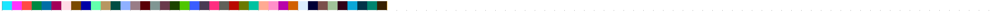

In [12]:
sns.palplot(sns.color_palette(godsnot_102))

In [13]:
uniq_clusters=np.unique(SpaSEG_cluster['SpaSEG_clusters'].astype('category'))
len_clusters = len(uniq_clusters)
_palette = dict(zip(uniq_clusters, godsnot_102[:len_clusters]))

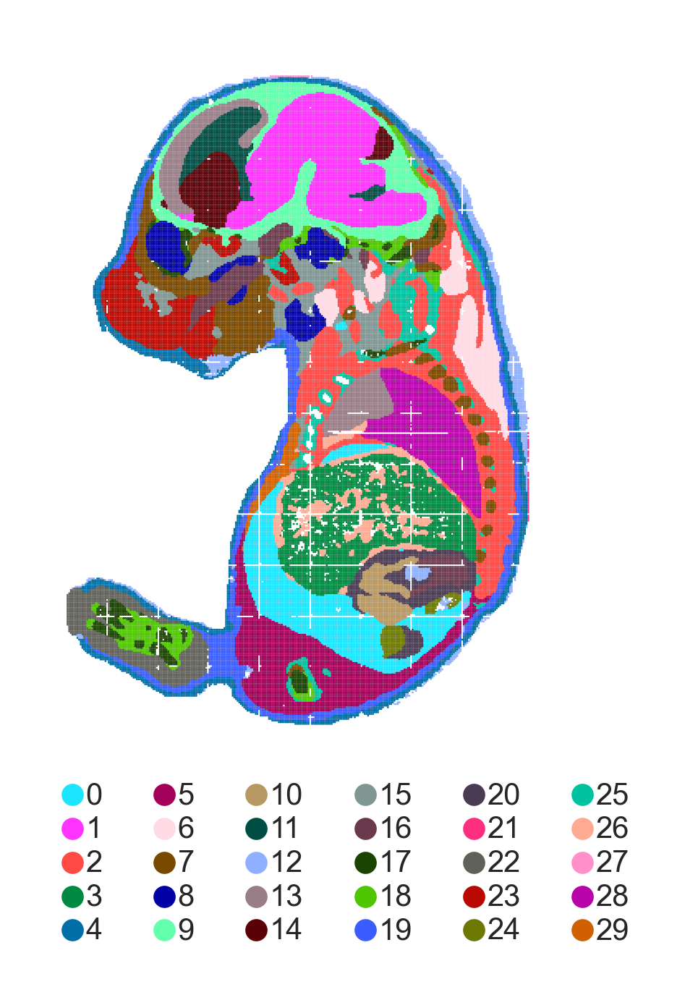

In [18]:
fig,ax=plt.subplots(figsize=(5.5*utils.centimeter, 5.5*utils.centimeter))
sc.pl.spatial(adata, img_key=None, color="SpaSEG_clusters",
              spot_size=1.2, show=False,ax = ax,frameon=False, palette=_palette)
ax.set_title(None)
leg=ax.legend(loc='lower left', bbox_to_anchor=[0., -0.3], ncol=6, frameon=False,
           markerscale=0.6, labelspacing=0.2, fontsize=5,
          handleheight= 0.8, handlelength=0.1
         )
# leg.get_title().set_fontsize('5')
plt.savefig(os.path.join(wk_root, "notebook/results/SVG/ME_domain.pdf"), bbox_inches='tight', format='pdf', dpi=400)


In [19]:
from matplotlib.colors import ListedColormap,LinearSegmentedColormap
clist=['#a50026','#d73027','#f46d43','#fdae61','#fee090','#e0f3f8','#abd9e9','#74add1','#4575b4'][::-1]
newcmp_r_svg_pattern = LinearSegmentedColormap.from_list('gene_cmap',clist,N=256)

In [76]:
_show_genes = ['Nnat', 'Mapt', 'Krt10', 'krt15', 'lbsp', 'Col5a2']

##
"""
see svg_ME_plot_tmp.py for plotting these genes
"""

'\nsee svg_ME_plot_tmp.py for plotting these genes\n'

In [77]:
"""
see svg_ME_plot_tmp_domain.py for plotting all SVGs in domain1,4,7
"""

'\nsee svg_ME_plot_tmp_domain.py for plotting all SVGs in domain1,4,7\n'

# Plot heatmap

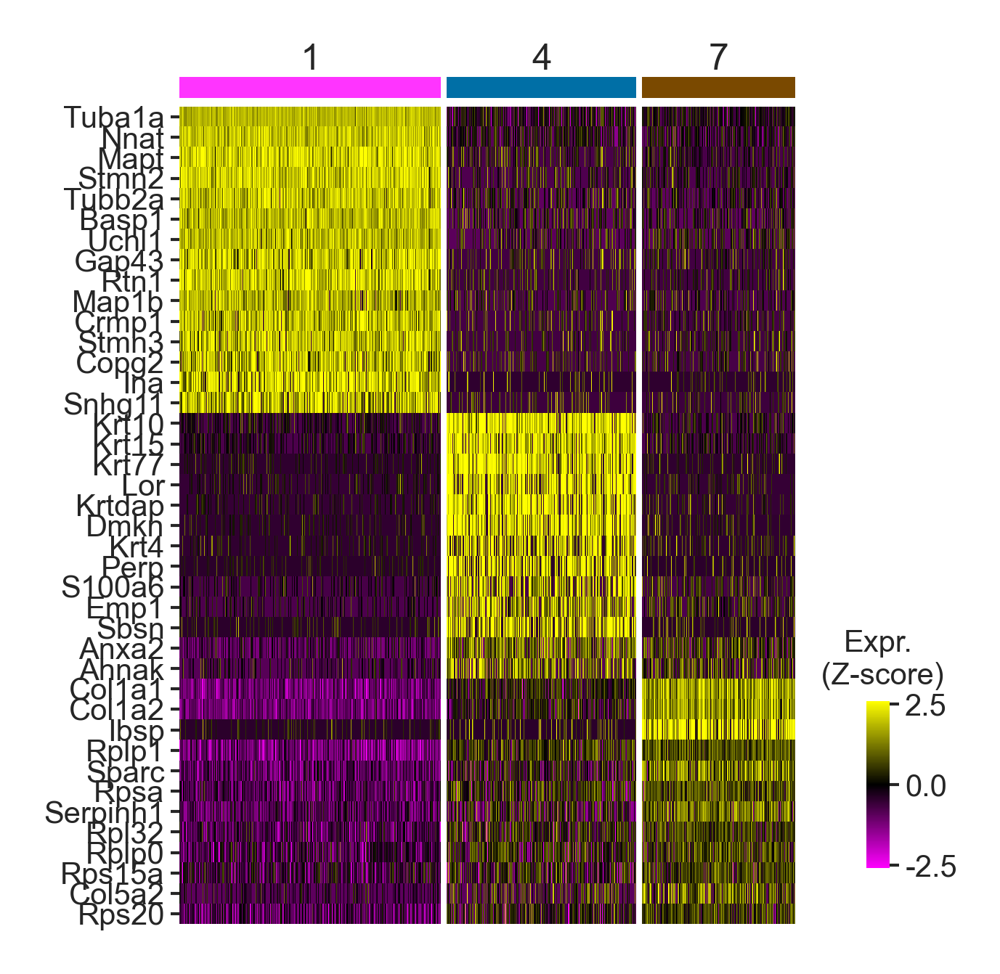

In [15]:
# sort
_group_df =  df_group.sort_values(by=['domain','log2_fc'],ascending=[True, False], ignore_index=True)

# get first 15 genes based on each domain
domain_genes_df = _group_df.groupby('domain').head(15)
domain_genes = domain_genes_df.groupby('domain')['gene'].apply(list).to_dict()

# domains to plot heatmap
domain_order=[1,4,7]

# adata
_adata_std_scale = adata.copy()
sc.pp.scale(_adata_std_scale, max_value=10)

gheatmap(_adata_std_scale, domain_genes, domain_key='SpaSEG_clusters', 
          palette=_palette, fig_w_cm=utils.centimeter*4.6, 
                               fig_h_cm=utils.centimeter*6.5, vmin=-2.6, vmax=2.6, domain_order=domain_order, yticklabelsize=5, interpolation='nearest')
plt.savefig(os.path.join(wk_root, "notebook/results/SVG/ME_147_heatmap.pdf"), bbox_inches='tight', format='pdf', dpi=400)

# Dotplot

In [80]:
_group_df =  df_group.sort_values(by=['domain','log2_fc'],ascending=[True, False], ignore_index=True)

# get first 6 genes based on each domain
_domain_genes_df = _group_df.groupby('domain').head(6)
genes_ = _domain_genes_df.loc[_domain_genes_df['domain'].isin([1,4,7]),'gene'].tolist()

In [81]:

_147adata = adata[adata.obs['SpaSEG_clusters'].isin([1,4,7])]
_147adata_df = _147adata.to_df().loc[:,genes_]
cnt_147adata_df = _147adata_df.copy()
cnt_147adata_df[cnt_147adata_df>0]=1
cnt_147adata_df['domain'] = _147adata.obs['SpaSEG_clusters'].tolist()
frct_147adata_df = (cnt_147adata_df.groupby('domain').sum()/cnt_147adata_df.groupby('domain').count()).reset_index()
frct_147adata_df

,domain,Tuba1a,Nnat,Mapt,Stmn2,Tubb2a,Basp1,Krt10,Krt15,Krt77,Lor,Krtdap,Dmkn,Col1a1,Col1a2,Ibsp,Rplp1,Sparc,Rpsa
0,1,1.000000,1.000000,0.999272,0.997815,0.997997,0.998907,0.551448,0.514114,0.225460,0.296485,0.268075,0.215626,0.984520,0.982881,0.202695,1.000000,0.854125,1.000000
1,4,0.955003,0.792358,0.373555,0.414530,0.494972,0.501760,0.957014,0.946204,0.880342,0.869784,0.870287,0.871795,0.994972,0.982403,0.174711,0.999497,0.862745,0.999246
2,7,0.986007,0.888682,0.444652,0.488495,0.540734,0.561256,0.490983,0.491604,0.216107,0.265236,0.268657,0.224813,1.000000,1.000000,0.842040,1.000000,0.992537,1.000000


In [82]:
_147adata_ = _adata_std_scale[_adata_std_scale.obs['SpaSEG_clusters'].isin([1,4,7])]
_147adata_df_ = _147adata_.to_df().loc[:,genes_]

_147adata_df_['domain'] = _147adata_.obs['SpaSEG_clusters'].tolist()
_147mean_gene_df_ = _147adata_df_.groupby('domain').mean().reset_index()
_147mean_gene_df_

,domain,Tuba1a,Nnat,Mapt,Stmn2,Tubb2a,Basp1,Krt10,Krt15,Krt77,Lor,Krtdap,Dmkn,Col1a1,Col1a2,Ibsp,Rplp1,Sparc,Rpsa
0,1,1.867573,1.983478,2.177707,2.070309,1.895066,1.821794,-0.296162,-0.336017,-0.281809,-0.268046,-0.298878,-0.299006,-1.104524,-1.064492,-0.223905,-1.173917,-0.859079,-0.834050
1,4,-0.194873,-0.263497,-0.224760,-0.224674,-0.192118,-0.198060,2.501701,2.241993,2.608608,2.452580,2.398906,2.487001,0.180060,-0.018992,-0.112914,0.310073,-0.099962,0.193800
2,7,-0.157753,-0.244452,-0.250710,-0.252106,-0.293905,-0.243439,-0.230317,-0.181821,-0.219011,-0.224564,-0.198859,-0.196361,1.661551,1.575253,2.756622,0.770494,1.235277,0.696874


In [83]:
domain_arr = []
gene_arr = []
mean_exp_arr = []
fraction_arr = []

for index, row in _147mean_gene_df_.iterrows():
    _domain = int(row['domain'])
    for i_gene in genes_:
        domain_arr.append(str(_domain))
        gene_arr.append(i_gene)
        mean_exp_arr.append(row[i_gene])
        fraction_arr.append(
            frct_147adata_df.loc[frct_147adata_df['domain']==_domain, i_gene].values[0]
        )
_147mean_gene_frac_df = pd.DataFrame({'domain': domain_arr, 'gene':gene_arr, 'mean_exp':mean_exp_arr,'frac':fraction_arr})

In [84]:
_147mean_gene_frac_df.head()

,domain,gene,mean_exp,frac
0,1,Tuba1a,1.867573,1.000000
1,1,Nnat,1.983478,1.000000
2,1,Mapt,2.177707,0.999272
3,1,Stmn2,2.070309,0.997815
4,1,Tubb2a,1.895066,0.997997


/tmp/ipykernel_1963/1026197907.py:14: UserWarning: FixedFormatter should only be used together with FixedLocator
  xticklabels = ax.set_xticklabels(genes_,rotation=45, ha='right',rotation_mode="anchor")


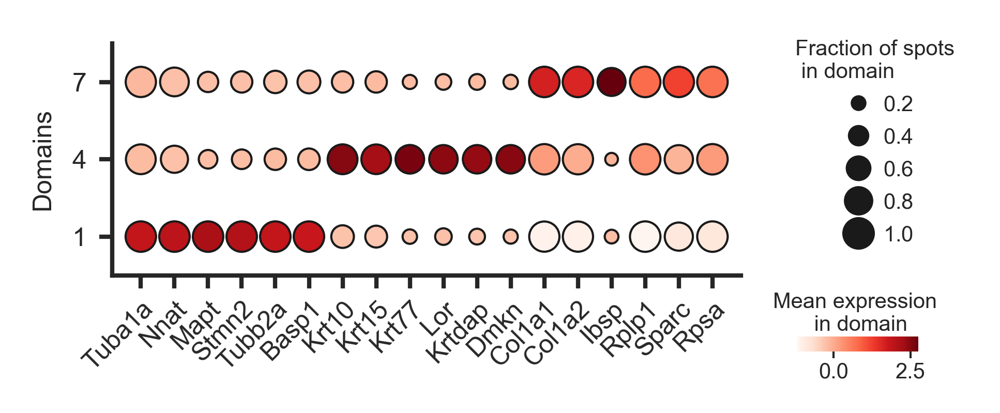

In [85]:
import matplotlib.ticker as mticker
fig,ax = plt.subplots(figsize=(utils.centimeter*6.6, utils.centimeter*2.5))

axa = ax.scatter(
    x = _147mean_gene_frac_df['gene'], 
    y = _147mean_gene_frac_df['domain'], 
    s = _147mean_gene_frac_df['frac']*50, 
    c = _147mean_gene_frac_df['mean_exp'], 
    cmap="Reds", 
    alpha=1, 
    edgecolors="k", 
    linewidth=0.5)
ax.set_ylim([-0.5,2.5])
xticklabels = ax.set_xticklabels(genes_,rotation=45, ha='right',rotation_mode="anchor")
for i, xticklabel in enumerate(xticklabels):
    xticklabel.set_y(xticklabel.get_position()[1] +  0.02)
ax.tick_params(direction='out', length=3, pad=3, width=1)
sns.despine()
ax.set_ylabel('Domains')

# color bar
cax = fig.add_axes([1.03,-0.1,0.15,0.05])
# fig.colorbar(im, cax=cax)
fig.colorbar(axa,cax=cax, orientation='horizontal')
cax.tick_params(direction='out',length=1.5, width=0.5, pad=1,labelsize=5)
cax.set_frame_on(False)
cax.set_title('Mean expression \n in domain', loc='center',fontsize=5, pad=1, y=1.1)

# legend
leg=ax.legend(*axa.legend_elements(prop='sizes', num=5, func=lambda x:x/50), 
              loc='upper right', bbox_to_anchor=[1.38, 1.1], ncol=1, 
              frameon=False, labelspacing=0.6,handlelength=1.5,
              fontsize=5,title='Fraction of spots \n in domain', title_fontsize=5)

plt.savefig(os.path.join(wk_root, "notebook/results/SVG/ME_147_dotplot.pdf"), bbox_inches='tight', format='pdf', dpi=400)

# GO

In [86]:
_group_df =  df_group.sort_values(by=['domain','log2_fc'],ascending=[True, False], ignore_index=True)

# get first 6 genes based on each domain
_domain_genes_df = _group_df[_group_df['domain'].isin([1,4,7])]
_domain_genes_df.to_csv(os.path.join(wk_root, "notebook/results/SVG/ME_147_genes4GO.csv"),index=False)
###
# download GO terms from http://geneontology.org/

In [87]:
_domain_genes_df

,gene,pvals_adj,log2_fc,in_fraction,out_fraction,max_fraction,in_expr_mean_log,in_expr_cv,max_expr_mean_log,max_expr_cv,max_expr_domain,log2_fc_in_max,domain,cv_r,in_out_fraction,in_max_fraction
16,Tuba1a,0.000000e+00,52.077312,1.000000,0.956024,1.000000,3.817849,0.235006,3.107390,0.491171,11,33.389185,1,0.478461,1.045998,1.000000
17,Nnat,0.000000e+00,36.167370,1.000000,0.829959,1.000000,3.398606,0.414156,3.308262,0.441465,14,3.729061,1,0.938140,1.204879,1.000000
18,Mapt,0.000000e+00,13.874829,0.999272,0.410481,0.908637,2.413698,0.427697,1.831639,0.786394,14,7.121657,1,0.543870,2.434389,1.099748
19,Stmn2,0.000000e+00,13.629125,0.997815,0.461463,0.965025,2.422661,0.431727,1.931566,0.605340,14,6.316449,1,0.713198,2.162287,1.033978
20,Tubb2a,0.000000e+00,12.163888,0.997997,0.547768,0.892934,2.358665,0.449461,1.633792,0.812646,14,7.891269,1,0.553083,1.821932,1.117661
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
182,Rpl32,1.300029e-250,6.187499,0.999378,0.997246,1.000000,3.008566,0.348394,2.880606,0.365253,2,3.510434,7,0.953844,1.002138,0.999378
183,Rplp0,1.469672e-256,5.357981,0.997201,0.985443,1.000000,2.717231,0.427423,2.326664,0.465020,11,7.061614,7,0.919150,1.011933,0.997201
184,Rps15a,5.611080e-223,4.313486,0.992848,0.971324,0.998354,2.528335,0.453149,2.213206,0.463597,11,4.887733,7,0.977463,1.022160,0.994485
185,Col5a2,0.000000e+00,3.874752,0.858831,0.542999,0.806145,1.605944,0.904458,1.330309,0.951433,15,1.796789,7,0.950627,1.581644,1.065356


# TOE

In [17]:
toe_adata = sc.read_h5ad(os.path.join(data_root, 'mouse_embryo/preprocessed_ME_toe.h5ad'))
toe_adata.obs['SpaSEG'] = toe_adata.obs['SpaSEG'].astype(int).astype('category')

In [14]:
_toe_palette = {k:v for k,v in _palette.items() if k in toe_adata.obs['SpaSEG'].values}

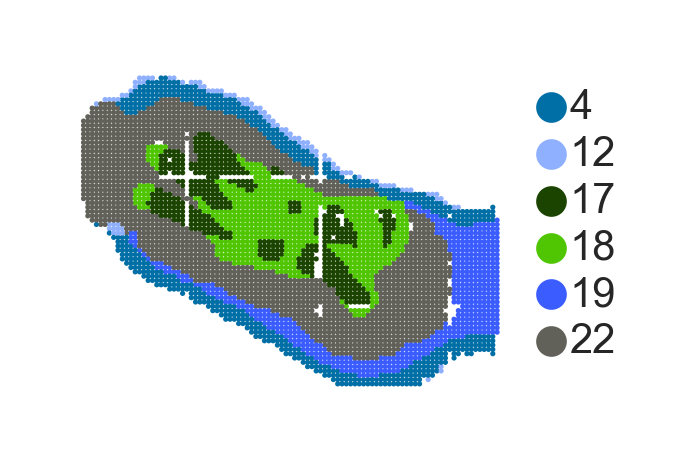

In [15]:
fig,ax=plt.subplots(figsize=(2.5*utils.centimeter, 2.5*utils.centimeter))
sc.pl.spatial(toe_adata, img_key=None, color="SpaSEG",
              spot_size=1.2, show=False,ax = ax,frameon=False, palette=_toe_palette)
ax.set_title(None)
leg=ax.legend(loc='lower left', bbox_to_anchor=[0.98, 0.01], ncol=1, frameon=False, 
           markerscale=0.6, labelspacing=0.2, fontsize=5,
          handleheight= 0.8, handlelength=0.1
         )

# leg.get_title().set_fontsize('5')
plt.savefig(os.path.join(wk_root, "notebook/results/SVG/ME_TOE_domain.pdf"), bbox_inches='tight', format='pdf', dpi=400)

In [12]:
df_group_toe = df_group[#(df_group['domain']==4) |
                       (df_group['domain']==12) |
                       (df_group['domain']==17) |
                       (df_group['domain']==18) | 
                       (df_group['domain']==19) | 
                       (df_group['domain']==22)]

In [13]:
df_group_toe.shape, len(df_group_toe['gene'].unique())

((35, 16), 23)

In [14]:
df_group_toe =  df_group_toe.sort_values(by=['domain','gene'],ascending=[True, True], ignore_index=True)

In [15]:
geens_toe = df_group_toe['gene'].unique().tolist()
print('\n'.join(geens_toe))

Afm
Cdk8
Cmss1
Fgfr2
H19
Hdac9
Jarid2
Lars2
Nkain2
Prkca
Prkch
Zc3h7a
Col2a1
Igf2
Actb
Col3a1
Lgals1
Camk1d
D130009I18Rik
Gm26561
Gphn
Il31ra
Vim


In [16]:
len(geens_toe)

23

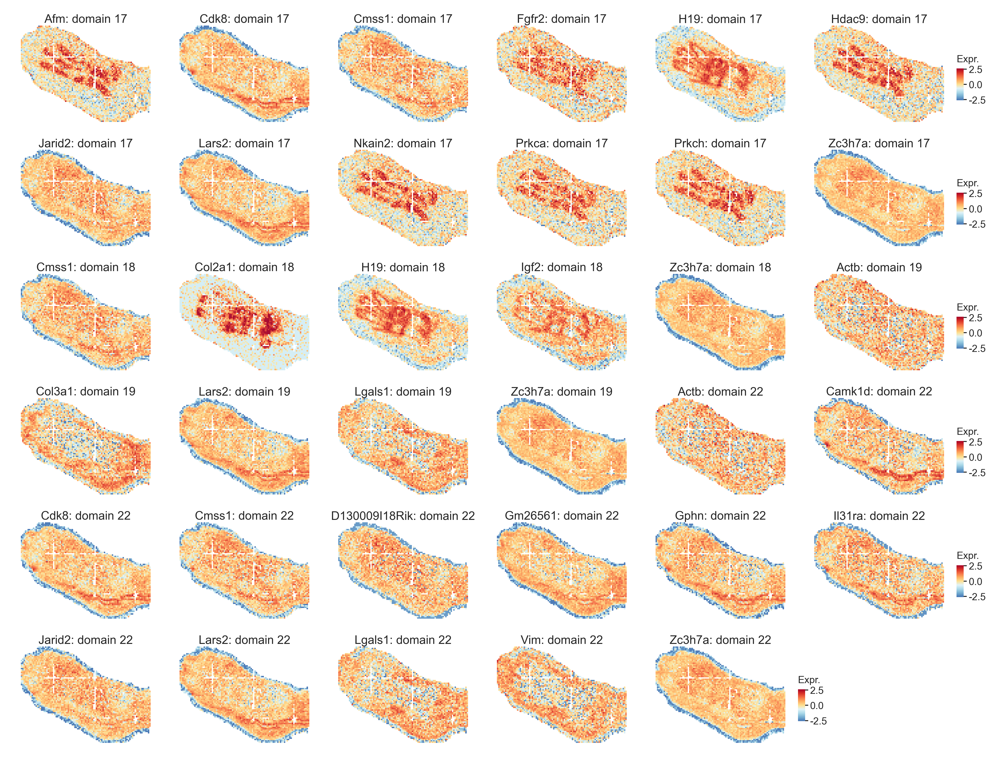

In [22]:
toe_genes = df_group_toe['gene'].tolist()
target_domains = df_group_toe['domain'].tolist()
svgplot(toe_adata, genes=toe_genes, frameon=False, panel_cbar=False, ncols=6,
                target_domain=target_domains,add_edge=False, cbar_wid_r=0.05,
                domain_edge_color='k',axes_w_cm=3.5, spot_size=1.2, 
                st_type='stereo-seq', domain_edge_alpha=200,img_key=None, 
                cmap=newcmp_r_svg_pattern, wspace=0.01, hspace=0.01,vmin=-2.6,vmax=2.6)
plt.savefig(os.path.join(wk_root, f"notebook/results/SVG/ME_TOE_svgs_all.pdf"), bbox_inches='tight', format='pdf', dpi=400)